In [3]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

# Affine Space
- Vector spaces have an origin, Affine spaces do not
- Transforms between vector spaces are linear transforms
- Transforms between affine spaces are affine transforms
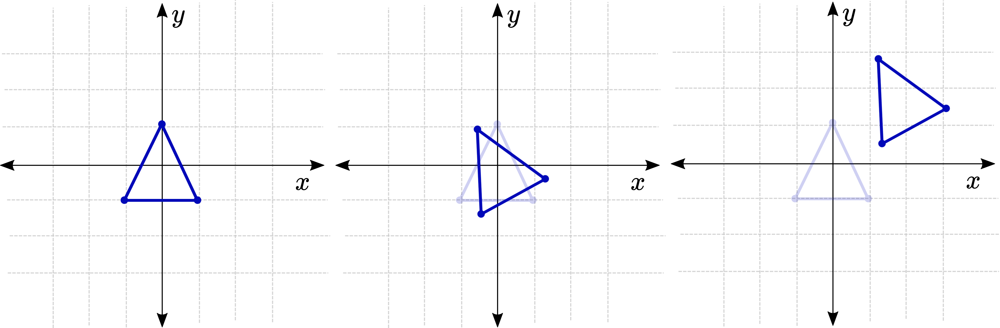
- The first image shows the input to the transform. 
- The second shows the output of a linear transform
- The third shows the output of an affine transform
- Linear is $y=Tx$. Affine is $y=Tx+b$
- Linear equations from high school are usually 1d affine transforms
    - $y=mx+b$
- In physics, affine transforms are often called galilean transforms
- We use both kinds frequently in AFSIM, the transform between WCS and ECI is linear, the transform between WCS and NED is affine.

# Why is Projective Space?
- One problem with affine transforms is that they aren't linear
    - Linear transforms are often much easier to deal with
    - Also, neither affine nor linear transforms can do division, $y=x_1/x_2$ is a nonlinear transform
- Related to this is the problem of the horizon
    - In affine space you can have lines which are parallel, meaning then never intersect.
    - Unfortunately, when we go out in the real world and use our eyes, it seems like all lines intersect, even if they don't!
    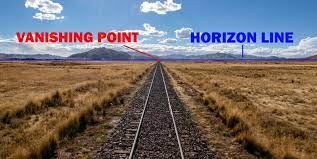
    - This is an effect called perspective, and it causes parallel lines to mean at a line called the horizon line
    - Mathematically, we say that the two lines intersect "at infinity"
- How do we fix these problems?
- We can solve both these problems by using the same mathematical structure: Projective space
- With projective space, we will find a way to perform affine transformations using linear transformations
- We will also add extra points "at infinty"

# What is projective space?
- We start with a definition, then we will explore what it means geometrically.
- (Euclidean) Projective space of dimension $n$ is defined to be the set of all lines through the origin in Euclidean space of dimension $n+1$.
- We want to visualize 3d projective space, but to do this we would need to look at lines in 4d space, which is hard.
- Instead we will visualize 2d projective space by using lines in 3d space, something that is quite easy to do

In [4]:
from sage.plot.plot3d.plot3d import axes
var("x y z t")
v1 = vector([1, 1, 1]).normalized()
v2 = vector([2, 1, 1]).normalized()
p=parametric_plot3d(t*v1, [t, -3, 3], thickness=2)
p+=parametric_plot3d(t*v2, [t, -3, 3], color="red", thickness=2)
p+= axes(3, 1, color="black")
show(p)


Graphics3d Object

- Another way to define projective space is as a set of tuples $[x, y, z]$ such that not all 3 are zero and $[x, y, z]=\lambda[x, y, z]$.
- Every vector here represents the same point in projective space

In [5]:
@interact
def _(t=(-3, 3, 0.1)):
    v1 = vector([1, 2, 1]).normalized()
    p=arrow((0,0,0), t*v1)
    p += axes(3, 1, color="black")
    show(p)

Interactive function <function _ at 0x6ffe08c78f80> with 1 widget
  t: FloatSlider(value=0.0, description='t',…

- We may embed affine space in projective space by saying that affine space is set of points where $z \neq 0$. If $[x,y,z]$ is such a point, then we can divide by $z$.
- This doesn't work if $z=0$
- This gets us $[x/z, y/z, 1]$. We can choose $x/z$ and $y/z$ arbitrarily, hence we get 2 dimensions of freedom for this.
- If you plot these points, you get this:

In [6]:
p=implicit_plot3d(z==1, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="red", opacity=0.8)
p+=implicit_plot3d(z==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), opacity=0.6)
p+=axes(3, 1, color="black")
p

Graphics3d Object

- In other words, affine space corresponds to slicing our space with a plane that doesn't go through the origin.
- We may draw an object in projective space, then intersect a plane with it to see what it looks like in affine space.
- We know that a point in affine space corresponds to a line in our higher dimensional space
- What does a line in affine space correspond to?
- It will correspond to a plane through the origin!

In [7]:
@interact
def _(line_at_infty=True, affine_plane_xy=True, line=True, line_intersect_xy=True, 
      point_at_inf=False, affine_plane_zy=False, line_intersect_zy=False):
    p=axes(3, 1, color="black")
    if line_at_infty:
        p+=implicit_plot3d(z==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), opacity=0.6)
    if affine_plane_xy:
        p+=implicit_plot3d(z==1, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="#dddddd", opacity=0.6)
    if line:
        f=x+y+z
        p+=implicit_plot3d(f==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="red", opacity=0.6)
        if line_intersect_xy:
            s=solve([f==0, z==1], x,z)
            p+=parametric_plot3d([s[0][0].right(), y, 1], (y, -3, 2), color="black", thickness=5)
        if line_intersect_zy:
            s=solve([f==0, x==1], y,x)
            p+=parametric_plot3d([1, s[0][0].right(), z], (z, -3, 2), color="black", thickness=5)
        if point_at_inf:
            s=solve([f==0, z==0], x,z)
            p+=parametric_plot3d([s[0][0].right(), y, 0], (y, -3, 2), color="green", thickness=5)
    if affine_plane_zy:
        p+=implicit_plot3d(x==1, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="#dddddd", opacity=0.6)
    show(p)
    

Interactive function <function _ at 0x6ffe08cadcb0> with 7 widgets
  line_at_infty: Checkbox(value=True, descr…

- Note that in this case there is still one point that isn't in our affine space, namely $[0, 1, 0]$. This is the point at infinity on our line
- Recall that any two planes through the origin intersect at a line (we can show this with linear algebra)
- Thus, any two lines in projective space intersect at a point:

In [8]:
p=axes(3, 1, color="black")
f=x+y+z
g=x-y-2*z
p+=implicit_plot3d(f==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="red", opacity=0.6)
p+=implicit_plot3d(g==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="green", opacity=0.6)
s=solve([f==0,g==0], x,y)
p+=parametric_plot3d([s[0][0].right(), s[0][1].right(), z], (z, -2, 2), color="blue", thickness=5)
p

Graphics3d Object

- In general, a dimension $n$ object in affine space corresponds to an $n+1$ dimensional object.
- In equational form, the line $ax+by-c=0$ will correspond to the plane $ax+by-cz=0$. Setting $z=1$, i.e. intersecting with our plane, gets back our original result.
- What if we have a plane $0x+0y-1z=0$? Then there are no points in affine space that intersect this plane.
- But the plane still exists!
- We call this the line "at infinty"
- We can choose a different plane to view the world through.
- Instead of embedding affine space using $z=1$, we can instead use $x=1$. Viewed from this lens, the line is just a regular line again

# Homographies
- We will spend a little bit dwelling on transforms of projective space.
- Note that linear transformations of euclidean space preserve lines. In other words, if you put a line through a linear transform, you will get a line out.
- Hence, an invertible linear transform induces an invertible transform between projective spaces.
- Such a transform is called a homography or projectivity.
- We note that a linear transform can be used to take any plane not through the origin to any other.
- Hence any two embeddings of affine space are related by a homography
- Finally, note that a skew transform of projective space can correspond to a translation of affine space

In [9]:
@interact
def _(t: (-3, 3, 0.1)):
    p=axes(3, 1, color="black")
    p+=implicit_plot3d(z==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), opacity=0.6)
    p+=implicit_plot3d(z==1, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="#dddddd", opacity=0.6)
    v=vector([0, 0, 1])
    m = Matrix([
        [1, 0, t],
        [0, 1, -t],
        [0, 0, 1]
    ])
    p+=arrow((0,0,0), m*v, color="red")
    pretty_print(m, v, "=", m*v)
    show(p)

Interactive function <function _ at 0x6ffe10f36950> with 1 widget
  t: FloatSlider(value=0.0, description='t',…

- Hence affine transforms are a special case of homography, as we discussed above!

# Conic Sections
- So, earlier we saw a way to go from an equation in affine space to one in projective space. (a line becomes a plane)
- This process can be done with any polynomial. I won't give details, but it is called homogenezation.
- In high school you probably learned about conic sections. You probably learned that they were given by degree 2 polynomials in 2 variables
- You probably also learned that you can get them by intersecting a plane with a cone
- Why are degree 2 polynomials and intersections of planes with cones related?
- The answer is that the homogenization of a conic section gives us a cone. As an example:

In [10]:
f=x^2-y^2+z^2
p=implicit_plot3d(f==0, (x,-3,3), (y,-3,3), (z,-3,3))
eqs = solve([f==0, z==1], y, z)
p+= parametric_plot3d([x, eqs[0][0].right(), 1], (x,-3,3), color="red", thickness=5)
p+=parametric_plot3d([x, eqs[1][0].right(), 1], (x,-3,3), color="red", thickness=5)
p+=implicit_plot3d(z==1, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="#dddddd", opacity=0.6)
p+=implicit_plot3d(y==1, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="#55ff55", opacity=0.6)
s=solve([f==0, y==1], y, z)
p+=parametric_plot3d([x, 1, s[0][1].right()], (x,-1,1), color="red", thickness=5)
p+=parametric_plot3d([x, 1, s[1][1].right()], (x,-1,1), color="red", thickness=5)
show(p)

Graphics3d Object

- Thus, we can see that by looking at a projective cone in affine space, we our usual notion of a conic section
- Because we can use homographies to change our embedding, we can see that every possible conic section comes from the same cone
- Hence, all conic sections are in a sense the same object. They are cones masquerading as something else

# Perspective transformation
- Now we come to our most important topic: perspective
- Our goal is to create a model of a camera that we will then use to draw our 2d world
- In 3d a camera is made by 4 planes intersecting at a point. The point is where the user is.
- You then remove some amount of the resulting pyramid
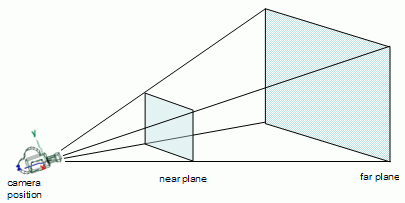
- The front of the resulting shape is supposed to be the users screen. The distance from the apex to this is called the "near" distance
- It represents the distance between the user and their screen
- The back of the pyramid is called the far plane
- In 2d things are simpler, we can model this as 2 lines intersecting at a point
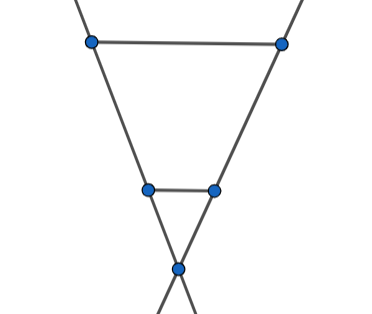
- Our goal is to take the truncated triangle and turn it into a rectangle.
- The following is the formula for the perspective projection in 2d. I can go through the details if you want
$$
\begin{pmatrix}
    \frac{2n}{r-l} & -\frac{r+l}{r-l} & 0 \\
    0 & \frac{f+n}{f-n} & \frac{2fn}{f-n} \\
    0 & 1 & 0
\end{pmatrix}
$$
- Long story short, it is a homography which takes the $z$ plane to the $y$ plane (and does a few other things)
- Suppose we have two parallel lines in our camera in affine space
- Since they are parallel, the point of intersection at infinity isn't within our affine space
- If we rotate that plane even a little, then the point at infinity comes into affine space.
- Thus, when we apply perspective, the parallel lines will appear to converge now.
- To draw a point, you first check if it is in the rectangle.
- If so, you find the closest point on the near plane, and draw your point there.

In [79]:
@interact
def _(show_affine_z_plane=True, show_affine_y_plane=False, draw_parallel_lines=False):
    n=1
    f=4
    l=-0.5
    r=0.5

    m = Matrix([
        [2*n/(r-l), -(r+l)/(r-l), 0],
        [0, (f+n)/(f-n), -2*f*n/(f-n)],
        [0, 1, 0]
    ])

    def P(v):
        o = m*v
        return o / o[2]

    camera_left = vector([0,0,1]).cross_product(vector([l, n, 1])).dot_product(vector([x,y,z]))
    camera_right = vector([0,0,1]).cross_product(vector([r, n, 1])).dot_product(vector([x,y,z]))

    parallel_left = vector([-0.25,n,1]).cross_product(vector([-0.25, n+1, 1])).dot_product(vector([x,y,z]))
    parallel_right = vector([0.25,n,1]).cross_product(vector([0.25, n+1, 1])).dot_product(vector([x,y,z]))

    p=axes(3, 1, color="black")
    if show_affine_z_plane:
        p+=implicit_plot3d(z==1, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="#dddddd", opacity=0.6)
    if show_affine_y_plane:
        p+=implicit_plot3d(y==1, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="#dddddd", opacity=0.6)

    p+=implicit_plot3d(camera_left==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="blue", opacity=1)
    p+=implicit_plot3d(camera_right==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="blue", opacity=1)
    if show_affine_z_plane:
        p+=parametric_plot3d([0.5*y, y, 1], (y,-3,3), color="black", thickness=5)
        p+=parametric_plot3d([-0.5*y, y, 1], (y,-3,3), color="black", thickness=5)
    if show_affine_y_plane:
        p+=parametric_plot3d([0.5, 1, z], (z,-3,3), color="black", thickness=5)
        p+=parametric_plot3d([-0.5, 1, z], (z,-3,3), color="black", thickness=5)
    if draw_parallel_lines:
        if show_affine_z_plane:
            p+=parametric_plot3d([0.25, y, 1], (y,-3,3), color="red", thickness=5)
            p+=parametric_plot3d([-0.25, y, 1], (y,-3,3), color="red", thickness=5)
        if show_affine_y_plane:
            p+=parametric_plot3d([x, 1, 4*x], (x,-3/4,3/4), color="red", thickness=5)
            p+=parametric_plot3d([x, 1, -4*x], (x,-3/4,3/4), color="red", thickness=5)
        p+=implicit_plot3d(parallel_left==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="green", opacity=0.8)
        p+=implicit_plot3d(parallel_right==0, (x, -3, 3), (y, -3, 3), (z, -3, 3), color="green", opacity=0.8)

    show(p)

Interactive function <function _ at 0x6ffe07782b90> with 3 widgets
  show_affine_z_plane: Checkbox(value=True,…